<a href="https://colab.research.google.com/github/suann124/AIinTeaching/blob/main/lectures/Ufuk_Firstorder_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# First-order systems


## What are we going to cover?


*   Introduce first-order (single-variable) linear ordinary differential equations (ODEs)
*   ...

## First-order systems

A first-order (single-variable, i.e., scalar) linear ordinary differential equation (ODE) is represented as

$$
\frac{dx(t)}{dt} = A x(t) + B u(t),
$$

where $A \in \mathbb{R}$ and $B \in \mathbb{R}$. Here, $x(t)$ is the state of the system at time $t$ and $u(t)$ is an input to the system at time $t$. Let $x_{0} \in \mathbb{R}$ be the initial condition.


> You may ask: What makes a differential equation an ODE?

❌ ❌ ❌ ❌ ❌

> You may (also) ask what makes an ODE a linear ODE, but more on it below.

How to link to another page? And, send back from that page to here?

Link: Check out this [optional reading](https://colab.research.google.com/github/suann124/AIinTeaching/blob/main/lectures/Firstorder_optional.ipynb).

❌ ❌ ❌ ❌ ❌

### Why do we care about first-order systems?

They are the simplest family of models we will encounter, and we will use them to get a sense of several key concepts we will cover throughout the semester.

### Example: Cruise control as a first-order system

The change in the speed of a car with respect to time can be represented as

$$\dot{v}(t) = -\frac{1}{\tau} v(t) + \frac{K}{\tau} w(t) + d(t),$$

where $v(t)$ is the speed at time $t$, $w(t)$ is the throttle command at time $t$ (this will play the role of a control input), and the signal $d$ represents the effects of disturbances (e.g., slope or wind). The constant parameters $\tau$ and $K$ capture the physical properties of the vehicle (e.g., mapping throttle to drive force) and the interaction of the vehicle with the environment (e.g., drag and rolling resistance).

For a cruise control system, a common objective is making the difference between a driver-specified desired speed, call it $v_d(t)$, and the actual speed $v(t)$ small. Let us introduce a new signal, which we will refer to as the error and denote as $e$:

$$e(t) = v_d(t) -v(t).$$

For a constant desired speed, $\dot{v}_d(t) = 0$ for all $0\geq 0.$ Then, $\dot{e}(t) = -v(t)$ and we can derive the following differential equation.

$$\dot{e}(t) = \frac{1}{\tau} e(t) + \frac{K}{\tau} w(t) + d(t) -\frac{1}{\tau} v_d$$

Our (control) objective will then be keeping $|e(t)|$ as close to zero as possible.

The ODE for $e$ includes three inputs: $u,$ $d$, and $v_d$. While we will later work with multiple inputs, for now, let us consider that a control input has already been designed in the form of $w(t) = k_p e(t)$ and there is no disturbance (i.e., $d \equiv 0$). Then, the model boils down to


$$\dot{e}(t) = \left(\frac{1}{\tau}+ \frac{Kk_p}{\tau}\right) e(t) - \frac{1}{\tau} v_d.$$

This model will inform us about the changes in $e$ with respect to $v_d$.

By choosing $x = e$, $u=w$,

$$ A = \left(\frac{1}{\tau}+ \frac{Kk_p}{\tau}\right) \text{, and } B = -\frac{1}{\tau},$$

this ODE can be written in the form of the generic first-order system above.

### What can we do with a model of a system?


1.  Predict system behavior by solving the ODE (for some given initial condition and input).
2.  Analyze the system behvior (for all initial conditions and inputs).
3.  Design a controller to influence the system behavior.

While this class focuses on analysis of systems and design of controllers, simulation the system behavior (for some initial controls and/or inputs) offer visual insights. So, let's start by simulating the cruise control model.







## Simulating the system behavior

Let us pick some arbitrary values for $A,$ $B,$ $v_d$ and initial conditions and simulate the system behavior.

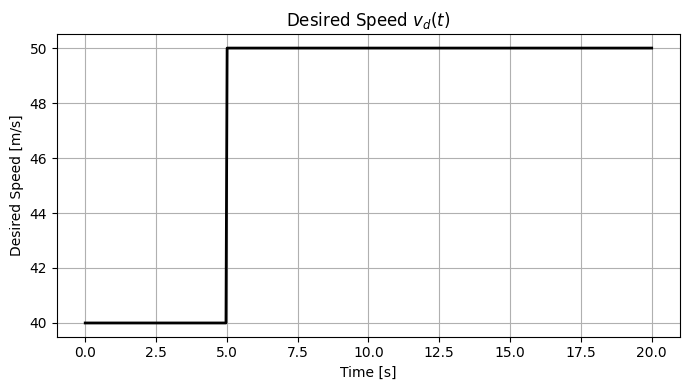

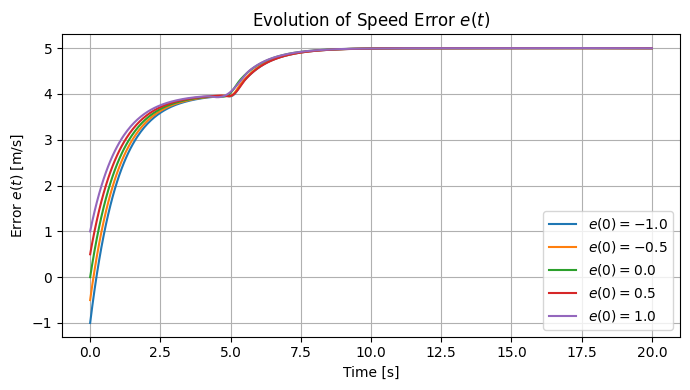

In [3]:
# @title Code for cruise control simulation
# @markdown Download MATLAB Script: [cruise_control.m](https://github.com/suann124/AIinTeaching/blob/main/MATLAB/First_order/cruise_control.m)
"""
Solve the first-order differential equation
    e_dot = A * e + B * v_d(t)
for a given desired speed profile v_d(t) and multiple initial conditions.

User specifies:
    - A, B: system parameters
    - x0_vec: list/array of initial error values
"""


import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp

# ======================================================
# User-defined parameters
# ======================================================
A = -1.0
B = 0.1
x0_vec = [-1.0, -0.5, 0.0, 0.5, 1.0]   # initial error values (m/s)
t_span = (0, 20)                         # time interval [s]
t_eval = np.linspace(t_span[0], t_span[1], 500)

# ======================================================
# Desired speed profile
# ======================================================
def v_d(t):
    """Desired speed changes from 40 to 50 at t = 5 s."""
    return 40.0 if t < 5.0 else 50.0

# ======================================================
# Differential equation
# ======================================================
def e_dot(t, e):
    """Derivative of the error."""
    return A * e + B * v_d(t)

# ======================================================
# Solve for each initial condition
# ======================================================
solutions = {}
for x0 in x0_vec:
    sol = solve_ivp(e_dot, t_span, [x0], t_eval=t_eval)
    solutions[x0] = sol

# ======================================================
# Plot 1: Desired speed profile
# ======================================================
plt.figure(figsize=(7, 4))
v_d_values = np.array([v_d(t) for t in t_eval])
plt.plot(t_eval, v_d_values, 'k', linewidth=2)
plt.title("Desired Speed $v_d(t)$")
plt.xlabel("Time [s]")
plt.ylabel("Desired Speed [m/s]")
plt.grid(True)
plt.tight_layout()

# ======================================================
# Plot 2: Error trajectories
# ======================================================
plt.figure(figsize=(7, 4))
for x0, sol in solutions.items():
    plt.plot(sol.t, sol.y[0], label=f"$e(0) = {x0}$")

plt.title("Evolution of Speed Error $e(t)$")
plt.xlabel("Time [s]")
plt.ylabel("Error $e(t)$ [m/s]")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

Downlaod MATLAB code: [code](https://github.com/suann124/AIinTeaching/blob/main/MATLAB/First_order/cruise_control.m).

We will frequently simulate the behavior of the systems we work with, but, let us now go back to our main goal: analysis of system behavior and, eventually, design of controller so that the system we control behaves as we want it to behave.

## What does it mean to be a solution to an ODE?

The solution satisfies the ODE and its initial condition. That is, if $\bar{x}$ is a solution, then

$$
\frac{d\bar{x}(t)}{dt} = A \bar{x}(t) + B u(t)
$$ and

$$\bar{x}(0) = x_0.$$

## Solution of the ODE for a first-order system

The solution is

$$
x(t) = e^{a t} x_0 + \int_{0}^{t} e^{a (t - \tau)} b\,u(\tau)\,d\tau.
$$

How do we know? Well, check whether it satis the conditions for being a solution.

Check the initial condition:

$$ x(0) = e^{A \cdot 0} x_0 + 0 = x_0.  ~~✅ $$

Check whether it satisfied the differential equation:

$$ \begin{aligned}
\frac{d x(t)}{d t}
&= A e^{A t} x_0 + a \int_{0}^{t} e^{A (t - \tau)} B\,u(\tau)\,d\tau
    + e^{A (t - t)} B\,u(t) - 0 \\[6pt]
&= A \left[e^{A t} x_0 + \int_{0}^{t} e^{A (t - \tau)} B\,u(\tau)\,d\tau \right] + B\,u(t) \\[6pt]
&= A\,x(t) + B \,u(t) ~~✅ \\[12pt]
\end{aligned}  $$

> How did we take the derivative of an integral? Recall: [Leibniz integral rule](https://en.wikipedia.org/wiki/Leibniz_integral_rule)

## Complete solution = free response + forced response

Let us take a closer look at the solution:

$$
x(t) = \color{red}{e^{a t} x_0} + \color{blue} {\int_{0}^{t} e^{a (t - \tau)} b\,u(\tau)\,d\tau}.
$$

The so-called free response is

$$ \color{red}{x_{free}(t) = e^{a t} x_0},$$

and it does not involve any contribution from input $u$. It is therefore sometimes also called the unforced response.

The so-called forced response is

$$ \color{blue}{x_{forced}(t) = \int_{0}^{t} e^{a (t - \tau)} b\,u(\tau)\,d\tau}$$

and it does not involve any contribution from the initial condition.

We can therefore analyze the free response and forced response separately to reason about the complete solution.

### Free response and stability of a system

The free response is the part of the system’s output that arises solely from its initial conditions, with no external input applied.

### Free response and stability of a system

The free response (also called the natural response) is the part of the system’s output that arises solely from its initial conditions, with no external input applied.

Note that the only system parameter that appear in $e^{At}x_0$ is $A.$ Let's analyze the free response for three cases with respect to the value of $A.$


#### Case 1: $A < 0$
$$
x_{free}(t) = e^{A t} x_0 \to 0 \quad \text{as } t \to \infty
$$  

regardless of the value of $x_0$. We will call the system (asymptotically) <u>stable</u> in this case. The free response converges to  $0$  <u>for all</u> initial conditions.

#### Case 2: $A > 0$
$$
|e^{A t} x_0| \text{ grows as } t \text{ increases unboundedly} \text{ (assuming $x_0 \neq 0$)}
$$  

We will call the system <u>unstable</u> in this case. The free response diverges <u>for some</u> initial conditions.

(For $x_0 = 0$, $x(t)$ remains at $0$.)


#### Case 3: $A = 0$
$$
x(t) = x_0 \text{ (constant over time)}
$$  

We call the system <u>marginally stable</u> in this case. While it is theoretically possible, this case is not practically interesting. (Why?)


Let us now simulate the free response of a linear system for several different values of $A$ and different initial conditions $x_0.$

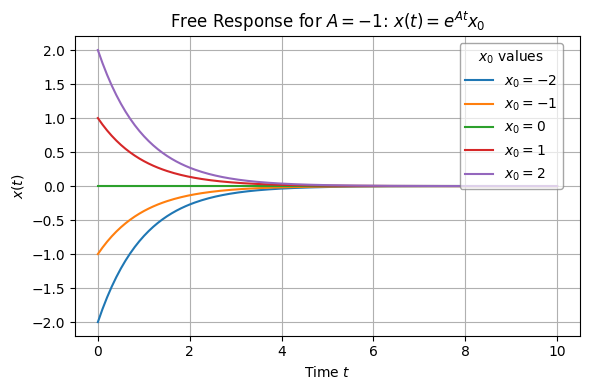

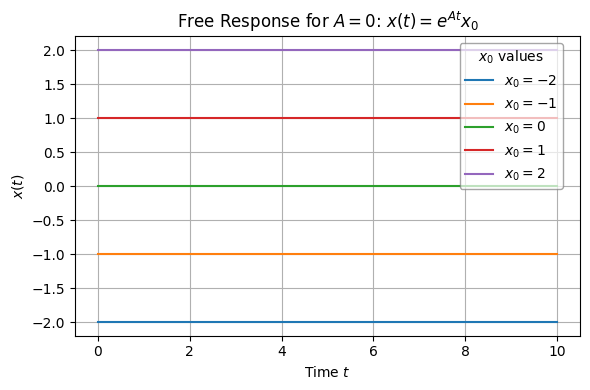

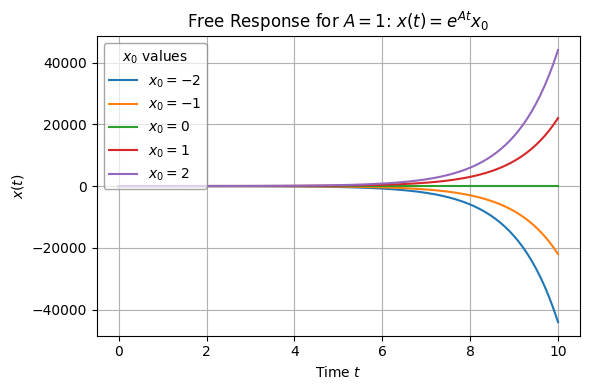

In [5]:
# @title Code for free response simulation
# @markdown Download MATLAB script: [free_response.m](https://github.com/suann124/AIinTeaching/blob/main/MATLAB/First_order/free_response.m)

import numpy as np
import matplotlib.pyplot as plt

# Parameters
x0_values = [-2, -1, 0, 1, 2]
t = np.linspace(0, 10, 200)
A_values = [-1, 0, 1]

# Generate plots
for A in A_values:
    plt.figure(figsize=(6, 4))
    for x0 in x0_values:
        x = np.exp(A * t) * x0
        plt.plot(t, x, label=f"$x_0 = {x0}$")

    plt.title(rf"Free Response for $A = {A}$: $x(t) = e^{{A t}} x_0$")
    plt.xlabel("Time $t$")
    plt.ylabel("$x(t)$")
    plt.grid(True)

    if A > 0:
    # Legend inside the plot at bottom-right
      plt.legend(
          title="$x_0$ values",
          loc="upper left",
          bbox_to_anchor=(0, 1.00),  # slightly inset from the edge
          ncol=1,
         frameon=True,
        facecolor="white",
        edgecolor="gray",
        framealpha=0.7   # transparency (0 = fully transparent, 1 = opaque)
      )
    else:
      plt.legend(
          title="$x_0$ values",
          loc="upper right",
          bbox_to_anchor=(0.98, 1.0),  # slightly inset from the edge
          ncol=1,
        frameon=True,
        facecolor="white",
        edgecolor="gray",
        framealpha=0.7   # transparency (0 = fully transparent, 1 = opaque)
      )

    plt.tight_layout()
    plt.show()


### Free response and time constant

Focus on the case $A < 0$ (i.e., the system is asymptotically stable).


The **time constant** $T$ of the system is defined as  
$$
T = \frac{1}{|A|} = -\frac{1}{A}.
$$

Hence,  
$$
x(t) = e^{A t} x_0 = e^{-t/T} x_0.
$$

Moral of the story: How fast the system approaches $0$ is not merely a function of the time that passes but it is a function of the ratio $t/T$, i.e., how many time constants amount of time have passed.

❌ ❌ ❌ ❌ ❌

> Here is more on the practical uses of time constants: XXXXX (Link to a page where Mustafa's text lives)

How to link to another page? And, send back from that page to here?

❌ ❌ ❌ ❌ ❌

Let's look at an example.

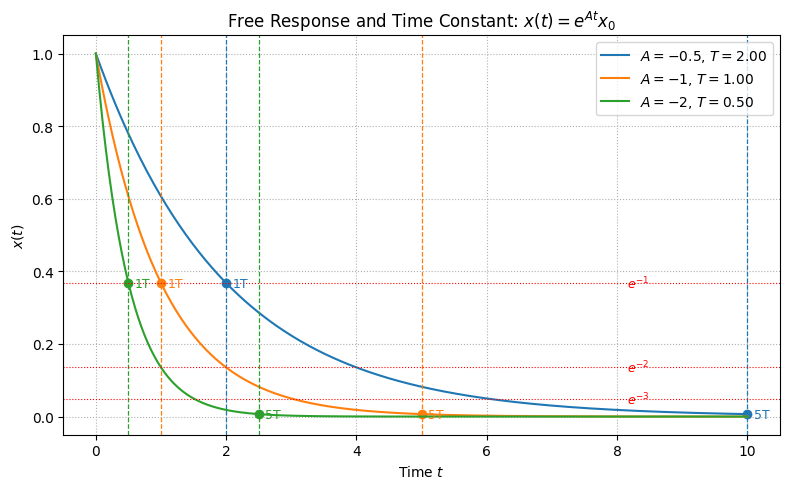

In [7]:
# @title Code for free response and time constant simulation
# @markdown Download MATLAB script: [free_response.m](https://github.com/suann124/AIinTeaching/blob/main/MATLAB/First_order/time_constant_response.m)

import numpy as np
import matplotlib.pyplot as plt

# Parameters
x0 = 1.0
t = np.linspace(0, 10, 400)
A_values = [-0.5, -1, -2]  # asymptotically stable cases (a < 0)
colors = ['tab:blue', 'tab:orange', 'tab:green']  # consistent colors

plt.figure(figsize=(8, 5))

for A, color in zip(A_values, colors):
    T = -1 / A
    x = np.exp(A * t) * x0
    plt.plot(t, x, color=color, label=f"$A = {A}$, $T = {T:.2f}$")

    # Plot vertical dashed lines at 1T and 5T in same color
    for k, label_text in zip([1, 5], ['1T', '5T']):
        tT = k * T
        plt.axvline(tT, color=color, linestyle='--', linewidth=0.9)
        plt.plot(tT, np.exp(A * tT) * x0, 'o', color=color)
        plt.text(tT + 0.1, np.exp(A * tT) * x0, f"{label_text}",
                 color=color, va='center', fontsize=9)

# Add horizontal e^{-k} reference lines
for k in range(1, 4):
    plt.axhline(np.exp(-k), color='r', linestyle=':', linewidth=0.8)
    plt.text(8.15, np.exp(-k), f"$e^{{-{k}}}$", color='r', va='center', fontsize=9)

# Labels and formatting
plt.title(r"Free Response and Time Constant: $x(t) = e^{A t} x_0$")
plt.xlabel("Time $t$")
plt.ylabel("$x(t)$")
plt.grid(True, which='both', linestyle=':')
plt.legend()
plt.tight_layout()
plt.show()


## Forced Response


Recall that the forced response for a first-order system is

$$
x_{forced}(t) = e^{A t} x_0 + \int_{0}^{t} e^{A (t - \tau)} B\,u(\tau)\,d\tau.
$$

It determines how the system reacts to external inputs.

The table below summarizes a comparison between the free response and forced response of a stable system.



| Part | Caused by | Exists if input = 0? | Depends on IC? | Behavior (for stable systems) |
|------|------------|----------------------|----------------|-------------------------------|
| **Free response** | The system’s own dynamics | ✅ Yes | ✅ Yes | Decays over time |
| **Forced response** | The external input | ❌ No | ❌ No | May persist as long as input acts |

The forced response is determined by the input. Therefore, for a better understanding, we will look into several (canonical) input types.


### Forced response with a step input (and zero initial conditions)

Consider the **step input** with magnitude $u_m$:

$$
u(t) =
\begin{cases}
0, & t<0,\\[3pt]
u_m, & t\ge 0.
\end{cases}
$$


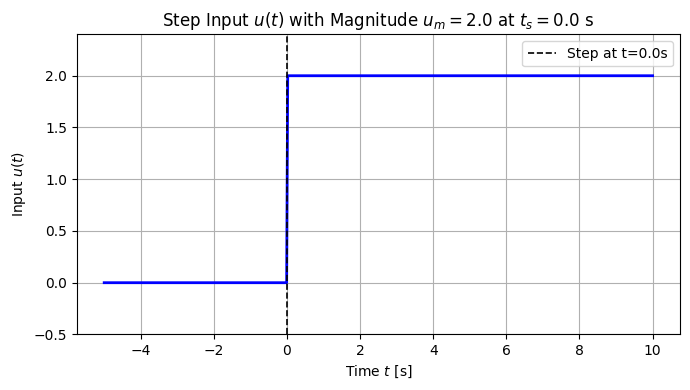

In [ ]:
"""
Generate and plot a step input signal:
        u(t) = 0 for t < t_s
        u(t) = u_m for t >= t_s
"""

import numpy as np
import matplotlib.pyplot as plt

# ======================================================
# User-defined parameters
# ======================================================
u_m = 2.0              # step magnitude
t_s = 0.0              # time at which the step occurs (default = 0)
t_start = -5           # start time (s)
t_end = 10             # end time (s)
num_points = 500       # number of points

# ======================================================
# Define the time vector and step function
# ======================================================
t = np.linspace(t_start, t_end, num_points)
u = np.where(t < t_s, 0, u_m)   # step at t_s

# ======================================================
# Plot the step input
# ======================================================
plt.figure(figsize=(7, 4))
plt.plot(t, u, 'b', linewidth=2)
plt.title(rf"Step Input $u(t)$ with Magnitude $u_m = {u_m}$ at $t_s = {t_s}$ s")
plt.xlabel("Time $t$ [s]")
plt.ylabel(r"Input $u(t)$")
plt.grid(True)
plt.axvline(t_s, color='k', linestyle='--', linewidth=1.2, label=f"Step at t={t_s}s")
plt.ylim(-0.5, 1.2 * u_m)
plt.legend()
plt.tight_layout()
plt.show()

For this step input, the forced response becomes
$$
\begin{aligned}
x_{forced}(t)
&= \int_{0}^{t} e^{a (t - \tau)} b\,u(\tau)\,d\tau \\
&= B\,u_m\, e^{A t} \int_{0}^{t} e^{-A\tau}\, d\tau \\
&=  B\,u_m\, e^{a t}\,\frac{1 - e^{-A t}}{A}  ~~~~~~(\text{assuming } a \neq 0)\\[2mm]
&=  \frac{B\,u_m}{A}\,(e^{A t} - 1).
\end{aligned}
$$


Then, for a stable first-order system (i.e., A < 0), $x_{forced}$ approaches a so-called <u>steady-state value</u>:

$$ x_{ss} = -\frac{B}{A}\,u_m, $$

and the <u>steady-state gain</u> for the system under step input is

$$\frac{x_{ss}}{u_m} = -\frac{B}{A}.$$



The forced response approaches its steady-state exponentially:
$$
x(t) = x_{ss}\,\big(1 - e^{A t}\big)
$$
Recall the **time constant** is
$$
T = \frac{1}{|A|}.
$$

At $t = \tau$, the output reaches about **63.2%** of its final value:
$$
\begin{aligned}
x(T) &= x_{ss}\,(1 - e^{-1}) \approx 0.632\,x_{ss} \\
x(2T) &= x_{ss}\,(1 - e^{-2}) \approx 0.869\,x_{ss}\\
x(3T) &= x_{ss}\,(1 - e^{-3}) \approx 0.950\,x_{ss}.\\
\end{aligned}
$$

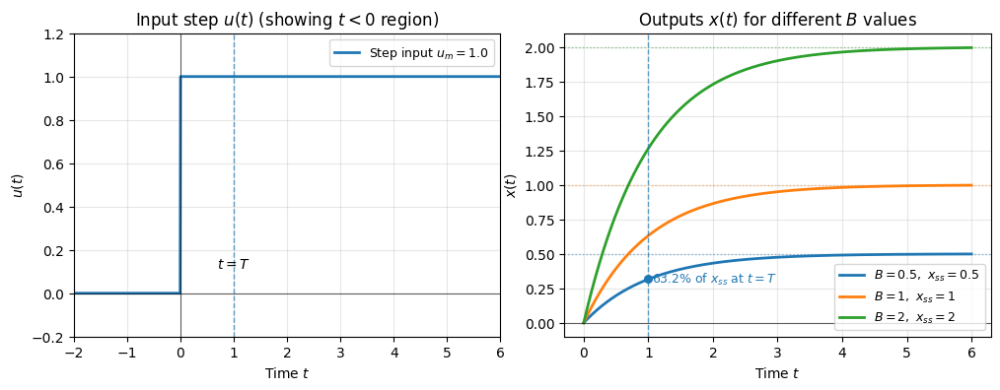

In [8]:
# @title Code for forced response with varying gain simulation
# @markdown Download MATLAB script: [step_response_multi_B.m](https://github.com/suann124/AIinTeaching/blob/main/MATLAB/First_order/step_response_multi_B.m)

import numpy as np
import matplotlib.pyplot as plt

def plot_inputs_outputs_multi_B(A=-1.0, B_values=(0.5, 1.0, 2.0),
                                u_m=1.0, t_pre=2.0, t_end=8.0, n_pts=1200):
    """
    Consistent notation: x(t) = -(B/A) * u_m * (1 - e^{A t})
    Shows input step (t<0 region) and responses for several B values.
    """
    if A >= 0:
        raise ValueError("Use A < 0 for a stable first-order system.")
    B_values = list(B_values)
    if len(B_values) == 0:
        raise ValueError("Provide at least one value in B_values.")

    # Time setup
    t_full = np.linspace(-t_pre, t_end, n_pts)
    t = np.linspace(0.0, t_end, n_pts)
    u = np.where(t_full >= 0, u_m, 0.0)
    T = 1.0 / abs(A)   # time constant

    # --- Figure setup ---
    fig, axes = plt.subplots(1, 2, figsize=(12, 4), sharex=False, gridspec_kw=dict(wspace=0.15))
    ax_u, ax_x = axes

    # --- Left: Step input ---
    ax_u.plot(t_full, u, linewidth=2, color='tab:blue', label=f"Step input $u_m={u_m}$")
    ax_u.axhline(0, color='k', linewidth=0.8, alpha=0.6)
    ax_u.axvline(0, color='k', linewidth=0.8, alpha=0.6)
    ax_u.axvline(T, linestyle='--', linewidth=1, alpha=0.7)
    ax_u.text(T, u_m*0.1, r"$t=T$", ha="center", va="bottom")
    ax_u.set_xlim(-t_pre, t_end)
    ax_u.set_ylim(-0.2*u_m, 1.2*u_m)
    ax_u.set_title("Input step $u(t)$ (showing $t<0$ region)")
    ax_u.set_xlabel("Time $t$")
    ax_u.set_ylabel("$u(t)$")
    ax_u.grid(True, alpha=0.3)
    ax_u.legend(fontsize=9)

    # --- Right: Outputs x(t) for multiple B values ---
    cmap = plt.get_cmap('tab10')

    for i, B in enumerate(B_values):
        color = cmap(i % 10)
        x_ss = -(B/A) * u_m
        x = x_ss * (1.0 - np.exp(A * t))
        ax_x.plot(t, x, linewidth=2, color=color, label=fr"$B={B:g},\ x_{{ss}}={x_ss:g}$")
        ax_x.axhline(x_ss, linestyle=':', linewidth=1, color=color, alpha=0.5)

    # 63.2% marker for first curve
    B0 = B_values[0]
    xss0 = -(B0/A) * u_m
    ax_x.scatter([T], [xss0*(1 - np.e**-1)], s=30, zorder=5, color=cmap(0))
    ax_x.annotate(r"$63.2\%$ of $x_{ss}$ at $t=T$",
                  xy=(T, xss0*(1 - np.e**-1)),
                  xytext=(T*1.05, xss0*(1 - np.e**-1)),
                  ha="left", va="center", fontsize=9, color=cmap(0))

    # Axis formatting
    ax_x.axhline(0, color='k', linewidth=0.8, alpha=0.6)
    ax_x.axvline(T, linestyle='--', linewidth=1, alpha=0.7)
    ax_x.set_title("Outputs $x(t)$ for different $B$ values")
    ax_x.set_xlabel("Time $t$")
    ax_x.set_ylabel("$x(t)$")
    ax_x.grid(True, alpha=0.3)
    ax_x.legend(fontsize=9)

    plt.show()

# Example run
plot_inputs_outputs_multi_B(A=-1.0, B_values=(0.5, 1.0, 2.0), u_m=1.0, t_pre=2.0, t_end=6.0)

## Complete solution = free response + forced response (under step inputs).


The complete solution for a step input with magnitude $u_m$ (applied at $t=0$) and an initial condition $x_0$ is

$$
x(t) = x_0 e^{A t} - \frac{B}{A} u_m \left( 1 - e^{A t} \right).
$$

Let us look at an example.

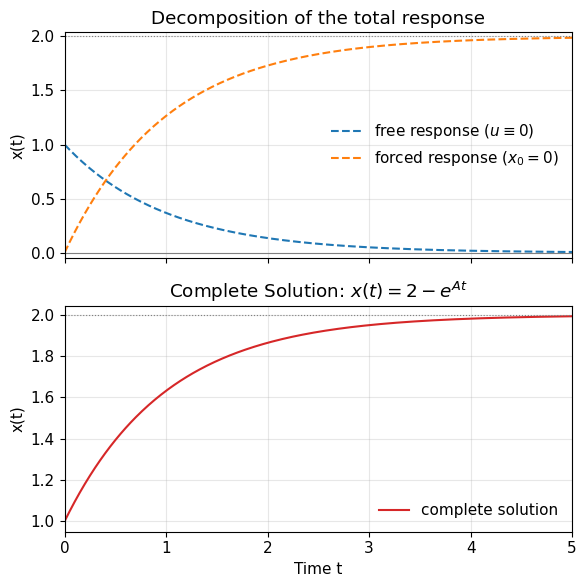

In [9]:
# @title Code for complete response simulation
# @markdown Download MATLAB script: [decomposition_first_order.m](https://github.com/suann124/AIinTeaching/blob/main/MATLAB/First_order/decomposition_first_order.m)

plt.rcParams.update({
    "mathtext.fontset": "dejavusans",
    "font.family": "DejaVu Sans",
    "font.size": 11
})
# ---- Parameters ----
A = -1.0           # stable system (a < 0)
B = 1.0
x0 = 1.0
u_m = 2.0          # chosen so that -(b/a)*u_m = 2
# ---- Time and analytic responses ----
t = np.linspace(0, 5, 400)
x_free   = x0 * np.exp(A*t)
x_forced = -(B/A)*u_m*(1 - np.exp(A*t))
x_total  = x_free + x_forced
# ---- Two stacked subplots ----
fig, ax = plt.subplots(2, 1, figsize=(6,6), sharex=True)
# (1) Free + Forced components
ax[0].plot(t, x_free, '--', label='free response ($u\\equiv0$)')
ax[0].plot(t, x_forced, '--', label='forced response ($x_0=0$)')
ax[0].axhline(0, color='gray', lw=0.8)
ax[0].axhline(2, color='gray', ls=':', lw=0.8)
ax[0].set_ylabel("x(t)")
ax[0].set_title("Decomposition of the total response")
ax[0].legend(frameon=False)
ax[0].grid(alpha=0.3)
ax[0].set_xlim(t[0], t[-1])
ax[0].set_ylim(min(x_free.min(), x_forced.min()) - 0.05,
               max(x_free.max(), x_forced.max()) + 0.05)
# (2) Complete solution
ax[1].plot(t, x_total, color='C3', label='complete solution')
ax[1].axhline(2, color='gray', ls=':', lw=0.8)
ax[1].set_xlabel("Time t")
ax[1].set_ylabel("x(t)")
ax[1].set_title("Complete Solution: $x(t) = 2 - e^{A t}$")
ax[1].legend(frameon=False)
ax[1].grid(alpha=0.3)
ax[1].set_xlim(t[0], t[-1])
ax[1].set_ylim(x_total.min() - 0.05, x_total.max() + 0.05)
plt.tight_layout()
plt.show()


### Revisit the cruise control example

The code/figures below demonstrate the effect of the variables time constants and stead-state gains on the system response.

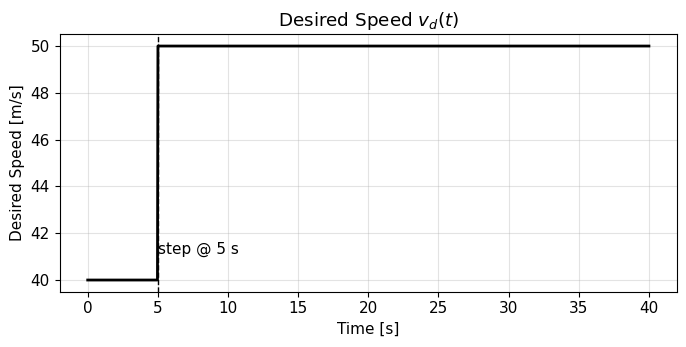

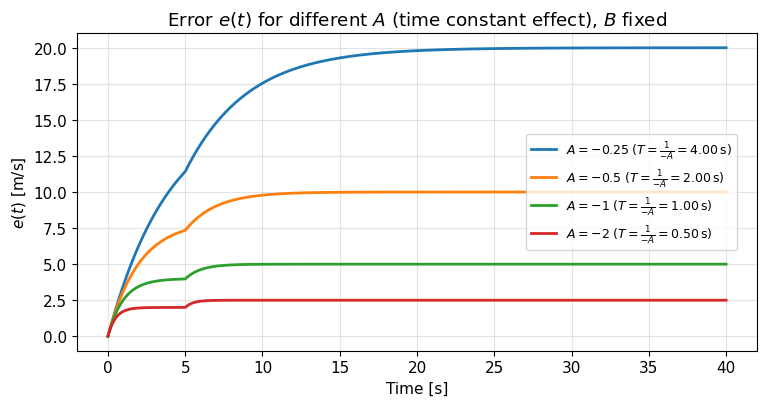

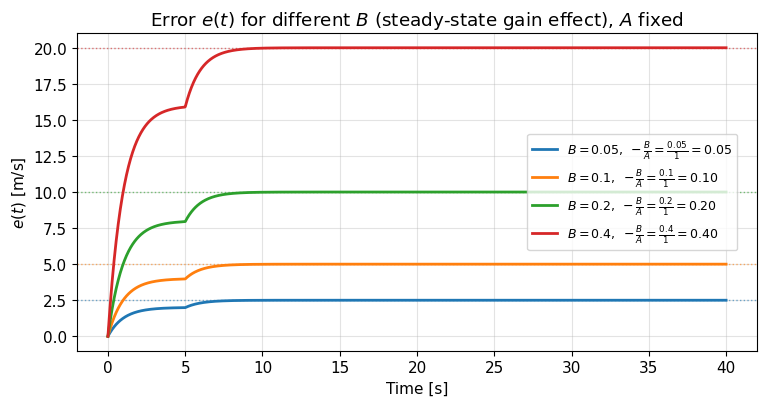

In [ ]:
# @title Code for effect of variables time constants and steady-state gains on cruise control simulation
# @markdown Download MATLAB script: [first_order_error_model.m](https://github.com/suann124/AIinTeaching/blob/main/MATLAB/First_order/first_order_error_model.m)


"""
Demonstrate the impact of time constant (T = 1/(-A)) and steady-state gain (-B/A)
on the first-order error model:

    e_dot = A * e + B * v_d(t)

Desired speed:
    v_d(t) = 40 for t < 5
           = 50 for t >= 5

"""

import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp

# ======================================================
# Simulation parameters
# ======================================================
t_span = (0.0, 40.0)
t_eval = np.linspace(t_span[0], t_span[1], 1200)

# Use one IC to isolate parameter effects
x0_vec = [0.0]

# Parameter sweeps
A_list = [-0.25, -0.5, -1.0, -2.0]   # affects time constant T = 1/(-A)
B_list = [0.05, 0.1, 0.2, 0.4]       # affects steady-state gain -B/A

# Fixed values when sweeping the other parameter
A_fixed = -1.0
B_fixed = 0.1

# ======================================================
# Desired speed profile and helper
# ======================================================
def v_d(t: float) -> float:
    """Desired speed: 40 for t < 5, 50 for t >= 5."""
    return 40.0 if t < 5.0 else 50.0

v_d_vec = np.vectorize(v_d)

# ======================================================
# ODE factory
# ======================================================
def make_e_dot(A, B):
    def e_dot(t, e):
        return A * e + B * v_d(t)
    return e_dot

# ======================================================
# 1) Plot v_d(t)
# ======================================================
plt.figure(figsize=(7, 3.6))
plt.plot(t_eval, v_d_vec(t_eval), 'k', linewidth=2)
plt.axvline(5.0, color='k', linestyle='--', linewidth=1)
plt.text(5.0, 41, "step @ 5 s", ha="left", va="bottom")
plt.title("Desired Speed $v_d(t)$")
plt.xlabel("Time [s]")
plt.ylabel("Desired Speed [m/s]")
plt.grid(True, alpha=0.35)
plt.tight_layout()

# ======================================================
# 2) Vary A (time constant effect), B fixed
# ======================================================
plt.figure(figsize=(7.8, 4.2))
cmap = plt.get_cmap('tab10')

for i, A in enumerate(A_list):
    if A >= 0:
        raise ValueError("Use A < 0 for stability.")
    T = 1.0 / (-A)
    color = cmap(i % 10)

    for x0 in x0_vec:
        sol = solve_ivp(make_e_dot(A, B_fixed), t_span, [x0], t_eval=t_eval,
                        rtol=1e-8, atol=1e-10)
        label = fr"$A={A:g}\; (T=\frac{{1}}{{-A}}={T:.2f}\,\mathrm{{s}})$" if x0 == x0_vec[0] else None
        plt.plot(sol.t, sol.y[0], color=color, linewidth=2, label=label)

plt.title(r"Error $e(t)$ for different $A$ (time constant effect), $B$ fixed")
plt.xlabel("Time [s]")
plt.ylabel(r"$e(t)$ [m/s]")
plt.grid(True, alpha=0.35)
plt.legend(fontsize=9, loc='center right', bbox_to_anchor=(0.98, 0.5))
plt.tight_layout()

# ======================================================
# 3) Vary B (steady-state gain effect), A fixed
# ======================================================
plt.figure(figsize=(7.8, 4.2))

for i, B in enumerate(B_list):
    color = cmap(i % 10)

    for x0 in x0_vec:
        sol = solve_ivp(make_e_dot(A_fixed, B), t_span, [x0], t_eval=t_eval,
                        rtol=1e-8, atol=1e-10)
        label = (fr"$B={B:g},\; -\frac{{B}}{{A}}=\frac{{{B:g}}}{{{-A_fixed:g}}}"
                 fr"={-B/A_fixed:.2f}$") if x0 == x0_vec[0] else None
        plt.plot(sol.t, sol.y[0], color=color, linewidth=2, label=label)

    # steady-state level as t→∞ (for v_d → 50)
    e_ss = -(B / A_fixed) * 50.0
    plt.axhline(e_ss, color=color, linestyle=':', linewidth=1, alpha=0.6)

plt.title(r"Error $e(t)$ for different $B$ (steady-state gain effect), $A$ fixed")
plt.xlabel("Time [s]")
plt.ylabel(r"$e(t)$ [m/s]")
plt.grid(True, alpha=0.35)
plt.legend(fontsize=9, loc='center right', bbox_to_anchor=(0.98, 0.5))
plt.tight_layout()

plt.show()

Download simulations in MATLAB scripts here: [MATLAB Scripts Download](https://colab.research.google.com/github/suann124/AIinTeaching/blob/main/lectures/Firstorder_MATLAB_scripts.ipynb)

## Response under sinusoidal inputs

Next, we will derive the response of a first-order linear system under sinusoidal inputs. We will derive this response through a seemingly unintuive way for convenience. We will derive the response first for complex-valued input signal of the following form.

$$ u(t) = \bar{u} e^{j \omega t}, \quad \text{for } t \ge 0,$$

where $\bar{u}$ is a fixed, <u>complex</u> number, $\omega$ is a fixed, <u>real</u> number, adn $j$ is the imaginary unit, i.e., $j = \sqrt{-1}$.


## Facts about complex numbers

Why are we interested in this complex-valued signal of time? Because it is directly related to (real-valued) sinusoidal signals (and it is easy to work with). To see the relation, let's recall the Euler's formula:

$$ e^{j \theta} = \cos(\theta) + j \sin(\theta)
$$

for any real-valued $\theta.$ Accordingly, the following holds:

$$ Real \left(e^{j \theta}\right) = cos (\theta) \text{ and } Imaginary \left(e^{j \theta}\right) = sin (\theta). $$

Recall that every complex number can be written in its polar form and its Cartesian form.

Cartesian form: $H = a + j b$ where $Real(H) = a$ and $Imaginary(H) = b.$

Polar form: $ H = r e^{j\theta}$ where $r$ is the length and and $\theta$ is the angle.

Here is an example plotted for $H = 3 + 4j = 5 e^{j 0.93}$ (note: $0.93 \text{ radians } \approx  53.13^o$).

Saved plot as H_complex_plot.png


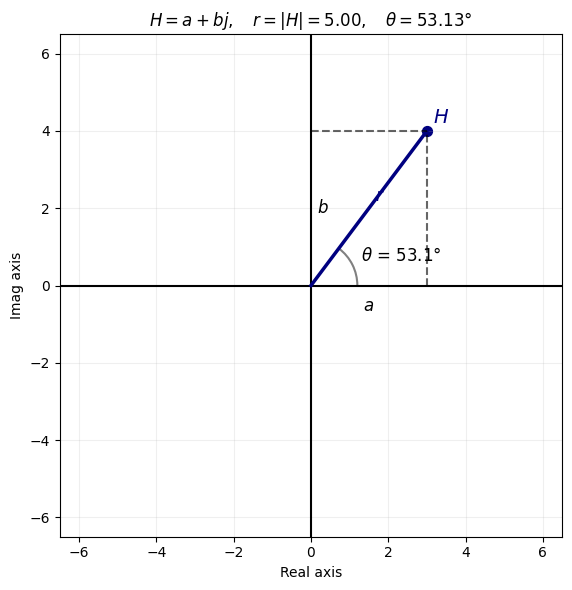

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Arc
import cmath

def plot_H(z, show_degrees=False, save_path=None):
    """
    Plot a generic complex number H on the complex plane, showing:
      - Real part (a)
      - Imaginary part (b)
      - Magnitude (r = |H|)
      - Angle (θ = arg(H))
    """
    a, b = z.real, z.imag
    r = abs(z)
    theta = cmath.phase(z)

    fig, ax = plt.subplots(figsize=(6, 6))
    ax.axhline(0, color="black", linewidth=1.5)
    ax.axvline(0, color="black", linewidth=1.5)
    ax.grid(True, alpha=0.2)

    # Vector H
    ax.plot([0, a], [0, b], color="navy", linewidth=2.5)
    ax.scatter(a, b, color="navy", s=50)

    # Projections
    ax.plot([a, a], [0, b], "k--", alpha=0.6)
    ax.plot([0, a], [b, b], "k--", alpha=0.6)

    # Labels
    ax.text(a / 2, -0.3, r"$a$", fontsize=12, ha="center", va="top")
    ax.text(0.15, b / 2, r"$b$", fontsize=12, ha="left", va="center")
    ax.text(a * 0.55, b * 0.55, r"$r$", fontsize=12, color="navy")
    ax.text(a * 1.05, b * 1.05, r"$H$", fontsize=14, color="navy")

    # Angle arc
    arc_radius = 0.3 * max(1, abs(a), abs(b))
    theta_deg = np.degrees(theta)
    arc = Arc((0, 0), 2 * arc_radius, 2 * arc_radius,
              theta1=0, theta2=theta_deg, color="gray", linewidth=1.5)
    ax.add_patch(arc)
    label_angle = theta / 2 if theta != 0 else 0.0001
    angle_label = r"$\theta$" + (f" = {theta_deg:.1f}°" if show_degrees else "")
    ax.text(arc_radius * 1.2 * np.cos(label_angle),
            arc_radius * 1.2 * np.sin(label_angle),
            angle_label, fontsize=12)

    # Axes formatting
    ax.set_xlabel("Real axis")
    ax.set_ylabel("Imag axis")
    ax.set_aspect("equal", adjustable="box")
    lim = max(abs(a), abs(b), r) * 1.3
    ax.set_xlim(-lim, lim)
    ax.set_ylim(-lim, lim)

    ax.set_title(fr"$H = a + bj,\quad r = |H| = {r:.2f},\quad \theta = {theta_deg:.2f}°$" if show_degrees
                 else fr"$H = a + bj,\quad r = |H| = {r:.2f},\quad \theta = {theta:.2f}\text{{ rad}}$")

    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=200, bbox_inches="tight")
    else:
        plt.show()

if __name__ == "__main__":
    # Example: H = 3 + 4j
    plot_H(3 + 4j, show_degrees=True, save_path="H_complex_plot.png")
    print("Saved plot as H_complex_plot.png")

You can also play with the demo below to convince yourself that one can go back and forth between the two representations of complex numbers.

In [ ]:

import math
import cmath
import sys

APP_TITLE = "Complex Number Converter — Cartesian ↔ Polar"

def fmt_float(x, places=6):
    s = f"{x:.{places}f}"
    return s.rstrip("0").rstrip(".") if "." in s else s

# ---------------- CLI fallback ----------------
def cli_cartesian_to_polar(a, b):
    z = complex(a, b)
    r = abs(z)
    theta = cmath.phase(z)
    return r, theta

def cli_polar_to_cartesian(r, theta):
    z = cmath.rect(r, theta)
    return z.real, z.imag

def run_cli():
    print(APP_TITLE)
    print("-" * len(APP_TITLE))
    print("Running in CLI mode (no GUI display detected).")
    print("Choose input form:\n  [C] Cartesian (a + bj)\n  [P] Polar (r, θ)")
    choice = input("Your choice (C/P): ").strip().upper()

    if choice == "C":
        try:
            a = float(input("Real part a: ").strip())
            b = float(input("Imag part b: ").strip())
        except ValueError:
            print("Invalid numeric input.")
            return
        r, theta = cli_cartesian_to_polar(a, b)
        print("\nPolar form:")
        print(f"  r   = {fmt_float(r)}")
        print(f"  θ   = {fmt_float(theta)} rad  ({fmt_float(math.degrees(theta))}°)")
    elif choice == "P":
        try:
            r = float(input("Magnitude r (≥ 0): ").strip())
            ang = input("Angle θ (append 'd' for degrees, otherwise radians): ").strip().lower()
            if ang.endswith("d"):
                theta = math.radians(float(ang[:-1]))
            else:
                theta = float(ang)
        except ValueError:
            print("Invalid numeric input.")
            return
        if r < 0:
            print("Magnitude must be non-negative.")
            return
        x, y = cli_polar_to_cartesian(r, theta)
        print("\nCartesian form:")
        sign = "+" if y >= 0 else "-"
        print(f"  z   = {fmt_float(x)} {sign} {fmt_float(abs(y))}j")
    else:
        print("Please enter 'C' or 'P'.")

# ---------------- Tkinter GUI -----------------
def run_gui():
    import tkinter as tk
    from tkinter import ttk, messagebox

    class ComplexConverterApp(ttk.Frame):
        def __init__(self, master):
            super().__init__(master, padding=12)
            self.pack(fill="both", expand=True)

            self.real_var = tk.StringVar(value="")
            self.imag_var = tk.StringVar(value="")
            self.mag_var  = tk.StringVar(value="")
            self.ang_var  = tk.StringVar(value="")
            self.unit_var = tk.StringVar(value="Degrees")
            self.normalize_var = tk.BooleanVar(value=True)

            self._build_ui()
            self._bind_events()

        def _build_ui(self):
            title = ttk.Label(self, text="Enter either form and click Convert", font=("", 14, "bold"))
            title.grid(row=0, column=0, columnspan=4, sticky="w", pady=(0, 8))

            cart = ttk.LabelFrame(self, text="Cartesian (a + bj)")
            cart.grid(row=1, column=0, columnspan=4, sticky="ew", pady=6)
            cart.columnconfigure([1,3], weight=1)

            ttk.Label(cart, text="Real (a):").grid(row=0, column=0, sticky="e", padx=6, pady=6)
            self.real_entry = ttk.Entry(cart, textvariable=self.real_var, width=18)
            self.real_entry.grid(row=0, column=1, sticky="ew", padx=(0, 12), pady=6)

            ttk.Label(cart, text="Imag (b):").grid(row=0, column=2, sticky="e", padx=6, pady=6)
            self.imag_entry = ttk.Entry(cart, textvariable=self.imag_var, width=18)
            self.imag_entry.grid(row=0, column=3, sticky="ew", padx=(0, 12), pady=6)

            self.btn_c2p = ttk.Button(cart, text="Convert from Cartesian → Polar", command=self.cartesian_to_polar)
            self.btn_c2p.grid(row=1, column=0, columnspan=4, sticky="ew", padx=6, pady=(0, 6))

            polar = ttk.LabelFrame(self, text="Polar (r, θ)")
            polar.grid(row=2, column=0, columnspan=4, sticky="ew", pady=6)
            polar.columnconfigure([1,3], weight=1)

            ttk.Label(polar, text="Magnitude (r):").grid(row=0, column=0, sticky="e", padx=6, pady=6)
            self.mag_entry = ttk.Entry(polar, textvariable=self.mag_var, width=18)
            self.mag_entry.grid(row=0, column=1, sticky="ew", padx=(0, 12), pady=6)

            ttk.Label(polar, text="Angle (θ):").grid(row=0, column=2, sticky="e", padx=6, pady=6)
            self.ang_entry = ttk.Entry(polar, textvariable=self.ang_var, width=18)
            self.ang_entry.grid(row=0, column=3, sticky="ew", padx=(0, 12), pady=6)

            unit_row = ttk.Frame(polar)
            unit_row.grid(row=1, column=0, columnspan=4, sticky="ew", padx=6, pady=(0,6))
            ttk.Label(unit_row, text="Angle units:").pack(side="left")
            self.unit_cb = ttk.Combobox(unit_row, textvariable=self.unit_var, values=["Degrees","Radians"], width=10, state="readonly")
            self.unit_cb.pack(side="left", padx=(6, 12))
            self.norm_cb = ttk.Checkbutton(unit_row, text="Normalize angle to (-π, π]", variable=self.normalize_var)
            self.norm_cb.pack(side="left")

            self.btn_p2c = ttk.Button(polar, text="Convert from Polar → Cartesian", command=self.polar_to_cartesian)
            self.btn_p2c.grid(row=2, column=0, columnspan=4, sticky="ew", padx=6, pady=(0, 6))

            self.pretty_lbl = ttk.Label(self, text="", font=("", 11))
            self.pretty_lbl.grid(row=3, column=0, columnspan=4, sticky="w", pady=(6, 4))

            btns = ttk.Frame(self)
            btns.grid(row=4, column=0, columnspan=4, sticky="ew", pady=(4,0))
            ttk.Button(btns, text="Clear", command=self.clear_all).pack(side="left")
            ttk.Button(btns, text="Close", command=self.master.destroy).pack(side="right")

        def _bind_events(self):
            self.real_entry.bind("<Return>", lambda e: self.cartesian_to_polar())
            self.imag_entry.bind("<Return>", lambda e: self.cartesian_to_polar())
            self.mag_entry.bind("<Return>", lambda e: self.polar_to_cartesian())
            self.ang_entry.bind("<Return>", lambda e: self.polar_to_cartesian())
            self.unit_cb.bind("<<ComboboxSelected>>", lambda e: self.on_unit_change())

        def current_unit_is_degrees(self):
            return self.unit_var.get().lower().startswith("deg")

        def normalize_angle(self, theta):
            if not self.normalize_var.get():
                return theta
            theta = (theta + math.pi) % (2 * math.pi) - math.pi
            if math.isclose(theta, -math.pi):
                theta = math.pi
            return theta

        def update_pretty(self, z=None, r=None, theta=None):
            lines = []
            if z is not None:
                a, b = z.real, z.imag
                lines.append(f"Cartesian: z = {fmt_float(a)} {'+' if b >= 0 else '-'} {fmt_float(abs(b))}j")
            if r is not None and theta is not None:
                if self.current_unit_is_degrees():
                    theta_disp = fmt_float(math.degrees(theta))
                    unit = "°"
                else:
                    theta_disp = fmt_float(theta)
                    unit = " rad"
                lines.append(f"Polar: (r, θ) = ({fmt_float(r)}, {theta_disp}{unit})")
            self.pretty_lbl.config(text="   • " + "\n   • ".join(lines) if lines else "")

        def clear_all(self):
            for var in (self.real_var, self.imag_var, self.mag_var, self.ang_var):
                var.set("")
            self.pretty_lbl.config(text="")

        def on_unit_change(self):
            if self.mag_var.get() and self.ang_var.get():
                try:
                    self.polar_to_cartesian()
                except Exception:
                    pass
            elif self.real_var.get() or self.imag_var.get():
                try:
                    self.cartesian_to_polar()
                except Exception:
                    pass

        def cartesian_to_polar(self):
            try:
                a = float(self.real_var.get())
                b = float(self.imag_var.get())
            except ValueError:
                from tkinter import messagebox
                messagebox.showerror("Invalid input", "Please enter numeric Real and Imag parts.")
                return
            z = complex(a, b)
            r = abs(z)
            theta = cmath.phase(z)
            theta = self.normalize_angle(theta)
            if self.current_unit_is_degrees():
                self.ang_var.set(fmt_float(math.degrees(theta)))
            else:
                self.ang_var.set(fmt_float(theta))
            self.mag_var.set(fmt_float(r))
            self.update_pretty(z=z, r=r, theta=theta)

        def polar_to_cartesian(self):
            try:
                r = float(self.mag_var.get())
                theta_in = float(self.ang_var.get())
            except ValueError:
                from tkinter import messagebox
                messagebox.showerror("Invalid input", "Please enter numeric Magnitude and Angle.")
                return
            if r < 0:
                from tkinter import messagebox
                messagebox.showerror("Invalid magnitude", "Magnitude r must be non-negative.")
                return
            theta = math.radians(theta_in) if self.current_unit_is_degrees() else theta_in
            theta = self.normalize_angle(theta)
            z = cmath.rect(r, theta)
            self.real_var.set(fmt_float(z.real))
            self.imag_var.set(fmt_float(z.imag))
            self.update_pretty(z=z, r=r, theta=theta)

    root = tk.Tk()
    root.title(APP_TITLE)
    try:
        root.call("tk", "scaling", 1.2)
        style = ttk.Style()
        if "clam" in style.theme_names():
            style.theme_use("clam")
    except Exception:
        pass
    ComplexConverterApp(root)
    root.minsize(520, 360)
    root.mainloop()

def main():
    # Try GUI; if no display, fall back to CLI
    try:
        from tkinter import Tk  # probe import first
        # Attempt to create a root window to test display availability
        import tkinter as tk
        r = tk.Tk()
        r.withdraw()
        r.destroy()
        # If that worked, actually run GUI
        run_gui()
    except Exception as e:
        # Headless environment or Tk not available
        # Print a concise note and switch to CLI experience
        sys.stderr.write(f"[Info] GUI unavailable ({e}). Switching to CLI mode.\\n")
        run_cli()

if __name__ == "__main__":
    main()

[Info] GUI unavailable (no display name and no $DISPLAY environment variable). Switching to CLI mode.\n

Complex Number Converter — Cartesian ↔ Polar
--------------------------------------------
Running in CLI mode (no GUI display detected).
Choose input form:
  [C] Cartesian (a + bj)
  [P] Polar (r, θ)
Your choice (C/P): C
Real part a: 4
Imag part b: 3

Polar form:
  r   = 5
  θ   = 0.643501 rad  (36.869898°)


## The relation between complex-valued exponential signals and real-valued sinusoidal signals

Let us now focus on the case where $\theta = \omega t$ where $\omega$ is a fixed, real number and $t$ denotes an indeterminate variable (e.g., the time in out case).

Then, the Euler formula takes the form:

$$e^{j \omega t} = \cos(\omega t) + j \sin(\omega t)$.

Recall another fact: $|e^{j \omega t}|$ for every $\omega$ and $t$, i.e., on the complex plane $e^{j \omega t}$ is on the unit circle. The following animation shows how this point moves on the unit circle and how its real and imaginary parts map to sinusoidal signals of time.

> This script is for fixed $\omega$. Experiment with different values of $\omega$ in the script and check its impact. Can you see why we will refer to $\omega$ as "frequency"?



In [2]:
# ======================================================
# Euler's Formula Visualization: Single ω Rotation
# ======================================================
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

plt.ioff()  # prevent automatic static output

# --- Parameters ---
omega = 1.0
t_max = 2 * np.pi
n_frames = 200
t_vals = np.linspace(0, t_max, n_frames)

# --- Figure setup ---
fig, (ax_circle, ax_wave) = plt.subplots(1, 2, figsize=(10, 5))
ax_circle.set_aspect('equal', 'box')

theta = np.linspace(0, 2*np.pi, 400)
# Unit circle outline
ax_circle.plot(np.cos(theta), np.sin(theta), color='gray', linewidth=1.5)
# Axes (neutral color)
ax_circle.axhline(0, color='black', linewidth=1)
ax_circle.axvline(0, color='black', linewidth=1)

# Vector and projections
arrow, = ax_circle.plot([], [], color='green', linewidth=2)
dot, = ax_circle.plot([], [], 'bo')
proj_x, = ax_circle.plot([], [], 'b--', linewidth=1.5)  # cos → blue
proj_y, = ax_circle.plot([], [], 'r--', linewidth=1.5)  # sin → red
label_text = ax_circle.text(0, 1.25, "", color='blue', fontsize=12, ha='center')

ax_circle.text(0.75, -0.9, "Unit Circle\n$|e^{j\\omega t}|=1$", fontsize=10, color='gray')
ax_circle.set_xlim(-1.2, 1.2)
ax_circle.set_ylim(-1.2, 1.2)

# --- Sine/Cosine subplot ---
ax_wave.set_xlim(0, t_max / omega)
ax_wave.set_ylim(-1.2, 1.2)
ax_wave.axhline(0, color='black', linewidth=1)
sin_line, = ax_wave.plot([], [], 'r-', label=r'$\sin(\omega t)$')
cos_line, = ax_wave.plot([], [], 'b-', label=r'$\cos(\omega t)$')
ax_wave.legend(loc='upper right', fontsize=10)
ax_wave.set_xlabel(r"$t / \omega$")
ax_wave.set_ylabel("Amplitude")
ax_wave.set_title(r"$\omega = %.1f$ rad/s" % omega, fontsize=12)

def init():
    for ln in [arrow, dot, proj_x, proj_y, sin_line, cos_line]:
        ln.set_data([], [])
    label_text.set_text("")
    return arrow, dot, proj_x, proj_y, sin_line, cos_line, label_text

def animate(i):
    t = t_vals[i]
    x = np.cos(omega * t)
    y = np.sin(omega * t)

    arrow.set_data([0, x], [0, y])
    dot.set_data([x], [y])
    proj_x.set_data([0, x], [y, y])  # horizontal projection
    proj_y.set_data([x, x], [0, y])  # vertical projection
    label_text.set_text(r"$e^{j%.1f t}$" % omega)

    t_wave = t_vals[:i + 1] / omega
    sin_line.set_data(t_wave, np.sin(omega * t_vals[:i + 1]))
    cos_line.set_data(t_wave, np.cos(omega * t_vals[:i + 1]))
    return arrow, dot, proj_x, proj_y, sin_line, cos_line, label_text

anim = FuncAnimation(
    fig, animate, init_func=init,
    frames=n_frames, interval=40, blit=False, repeat=False
)

plt.close(fig)  # ✅ Prevent phantom snapshot
HTML(anim.to_jshtml())



## Response of $\frac{dx(t)}{dt} = A x + B u$ with $u(t) = \bar{u} e^{j \omega t}$ and initial condition $x(0) = x_0$.

**Assumption:** $A < 0$ (i.e., the system is stable).


The general solution is given by

$$
x(t) = e^{A t} x_0 + \int_0^t e^{A (t - \tau)} B\, u(\tau) \, d\tau
$$

Substitute $u(\tau) = \bar{u} e^{j \omega \tau}$:

$$
x(t) = e^{A t} x_0 + e^{A t} B \bar{u} \int_0^t e^{-A \tau} e^{j \omega \tau} d\tau
$$

$$
x(t) = e^{A t} x_0 + e^{A t} B \bar{u} \int_0^t e^{(j \omega - A)\tau} d\tau
$$

Note that $j\omega - A \neq 0$ since $j \omega$ is imaginary and $-A$ is real. Using this and taking the definite integral, we get

$$
x(t) = e^{A t} x_0 + \frac{B e^{A t}}{j \omega - A} \bar{u} \left[ e^{(j \omega - A)\tau} \right]_{\tau = 0}^{\tau = t}
$$

$$
x(t) = e^{A t} x_0 + \frac{B e^{A t}}{j \omega - A} \bar{u} \left( e^{(j \omega - A)t} - 1 \right)
$$

Simplify:

$$
x(t) = e^{A t} \left( x_0 - \frac{B \bar{u}}{j \omega - A} \right) + \frac{B }{j \omega - A} \bar{u} e^{j \omega t}
$$


If the output equation is $y = Cx + D u$, then the output is

$$
y(t) = C e^{A t} \left( x_0 - \frac{B \bar{u}}{j \omega - A} \right)
       + \frac{C B}{j \omega - A} \bar{u} e^{j \omega t}
       + D \bar{u} e^{j \omega t}.
$$

### Steady-State Response with Input $u(t) = \bar{u} e^{j \omega t}$.


Rearranging the terms in the above expression for $y(t)$:

$$
y(t) = C e^{A t} \left( x_0 - \frac{B \bar{u}}{j \omega - A} \right)
      + \left( D + \frac{C B}{j \omega - A} \right) \bar{u} e^{j \omega t}
$$


**Note:**  Since $A < 0$, $e^{A t} \to 0$ as $t \to \infty$.

Hence,

$$
C e^{A t} \left( x_0 - \frac{B \bar{u}}{j \omega - A} \right) \to 0
\quad \text{as } t \to \infty.
$$



At steady state (i.e., when $e^{A t}$ is "sufficiently small"),

$$
u(t) = \bar{u} e^{j \omega t}
\quad \Longrightarrow \quad
y_{ss}(t) =
\left( D + \frac{C B}{j \omega - A} \right) \bar{u} e^{j \omega t}
$$

where $y_{ss}(t)$ is the steady-state output.

We can then derive a central concept: the frequency response function:


$$
G(j \omega) = D + \frac{C B}{j \omega - A}.
$$



### What does all this say about real-valued (sinusoidal) inputs?

**Answer:**  The **real (imaginary)** part of the output is the output corresponding to the **real (imaginary)** part of the input.



**Reasoning:** Let the system be given by

$$
\dot{x}(t) = \frac{dx(t)}{dt} = A x + B u
$$

$$
y = C x + D u
$$

Write the complex-valued input, state, and output as

$$
u = u_r + j u_i, \quad x = x_r + j x_i, \quad y = y_r + j y_i.
$$

Then,

$$
\frac{d x_r}{d t} + j \frac{d x_i}{d t}
= A (x_r + j x_i) + B (u_r + j u_i)
$$

$$
y_r + j y_i = C (x_r + j x_i) + D (u_r + j u_i)
$$

The real and imaginary parts of these equations must hold individually:


$$
\dot{x}_r = A x_r + B u_r, \quad y_r = C x_r + D u_r
$$

and

$$
\dot{x}_i = A x_i + B u_i, \quad y_i = C x_i + D u_i
$$


Consequently, the system responds independently to the real and imaginary parts of the input.  That is, the real part of the output "corresponds" to the real part of the input, and the imaginary part of the output "corresponds" to the imaginary part of the input.

### A few more facts (and observations) about complex numbers

Consider $H \in \mathbb{C}$ (the set of complex numbers) with $H \neq 0$.



The angle $\angle H$ and the legth $|H|$ of $H$ satisfy

$$
\cos(\angle H) = \frac{\text{Re}(H)}{|H|}, \quad
\sin(\angle H) = \frac{\text{Im}(H)}{|H|}.
$$


It will be clear later why but, for now, let's take a closer look at this complex number: $H e^{j \theta}$, which is obtained by multiplying the complext number $H$ and with $e^{j \theta}.$ To this end, let us also write $H$ in its Cartesian form $H = H_R + j H_I$. Then,


$$
\text{Re}(H e^{j \theta}) = \text{Re}\!\left[ (H_R + j H_I)(\cos \theta + j \sin \theta) \right].
$$

Expanding:

$$
= H_R \cos \theta - H_I \sin \theta.
$$

Express $H_R$ and $H_I$ in terms of $|H|$ and $\angle H$:

$$
H_R = |H| \cos(\angle H), \quad H_I = |H| \sin(\angle H).
$$

Then,

$$
\text{Re}(H e^{j \theta})
= |H| \left( \cos(\angle H) \cos \theta - \sin(\angle H) \sin \theta \right).
$$

Using the trigonometric identity for $\cos(a + b)$:

$$
\text{Re}(H e^{j \theta}) = |H| \cos(\theta + \angle H).
$$

Similarly,

$$
\text{Im}(H e^{j \theta}) = |H| \sin(\theta + \angle H).
$$

Hence,

$$

\begin{aligned}
\text{Re}(H e^{j \theta}) &= |H| \cos(\theta + \angle H) \\
\text{Im}(H e^{j \theta}) &= |H| \sin(\theta + \angle H).
\end{aligned}
$$


### Constructing the sinusoidal steady-state output

The facts we already derived:

- For an exponential input

$$
u(t) = \bar{u} e^{j \omega t}
\quad \Longrightarrow \quad
y_{ss}(t) = G(j \omega) \bar{u} e^{j \omega t},
$$

where $G(j \omega) \bar{u}$ is, in general, a complex-valued quantity.


- For a complex number $H$ and a real number $\theta$ (for $H \neq 0$):

$$
\text{Re}(H e^{j \theta}) = |H| \cos(\theta + \angle H).
$$

Now, consider a real sinusoidal inputs with frequency $\omega$. If

$$
u(t) = \cos(\omega t) = \text{Re}(e^{j \omega t}),
$$

then

$$
y_{ss}(t) = |G(j \omega)| \cos(\omega t + \angle G(j \omega)).
$$


If

$$
u(t) = \sin(\omega t) = \text{Im}(e^{j \omega t}),
$$

then

$$
y_{ss}(t) = |G(j \omega)| \sin(\omega t + \angle G(j \omega)).
$$

$|G(j \omega)|$ is then the steady-state gain of the system under sinusoidal inputs with frequency $\omega$.

A special case boils down to the steady-state response under step inputs: If the input is constant, i.e.

$$
u(t) = 1 = e^{j \cdot 0 \cdot t},
$$

then

$$
y_{ss}(t) = |G(0)| = D - \frac{C B}{A},
$$ where recall that

$$|G(0)| = D - \frac{C B}{A}$$

is the steady-state gain of the system for step inputs.

If the inputs have a non-unit magnitude, the same results hold with the output scaled accordingly.

Let's put the results together (here $u_m$ is a real constant):


| **Input**          | **Steady-State Output** |
|--------------------|-------------------------|
| $u_m \sin(\omega t)$ | $u_m \, |G(j\omega)| \, \sin(\omega t + \angle G(j\omega)) $ |
| $u_m \cos(\omega t)$ |$u_m \, |G(j\omega)| \, \cos(\omega t + \angle G(j\omega))$ |
|$ u_m $               | $u_m \, |G(0)|$ |

We can derive several important observations:

- For a sinusoidal input, the steady-state output is **also sinusoidal with the same frequency** $\omega$.
- The system **does not change the frequency** of the input — only its **amplitude** and **phase**.

$$
\text{Output frequency} = \text{Input frequency} = \omega.
$$

- The output amplitude is scaled by the **magnitude of the frequency response function** \( |G(j\omega)| \):

$$
\text{Amplitude of output} = \alpha |G(j\omega)|.
$$

- The system introduces a **phase shift** \( \angle G(j\omega) \) between the input and output:

$$
\text{Phase lag} = \angle G(j\omega)
$$

- For a constant input $u_m$:

$$
\text{Steady-state output} = u_m |G(0)|.
$$

Overall, the frequency response function $G(j \omega)$ plays a key role in the analysis of and design for first-order linear systems (and we will later see that these concepts generalize straightforwardly for linear systems).

Let's take a look at an example.

$$
\frac{dx(t)}{dt} = -x(t) + u(t) \\
y(t) = 2x(t)
$$

This corresponds to $A=-1$, $B=1$, $C=2$, $D=0$.

> Is the system stable? Why?

The frequency response function is

$$
G(j\omega) = \frac{2}{j\omega + 1}.
$$

We can use it to predict the steady-state output for any sinusoidal input. In particular let's pick $u(t) = sin(3t)$, i.e., $\omega = 3$.

$$
G(j3) = \frac{2}{3j + 1}.
$$

$$
|G(j3)| = \frac{2}{|3j + 1|} = \frac{2}{\sqrt{10}} \approx 0.63
$$

$$
\angle G(j3) = \angle \frac{2}{3j + 1}.
= 0 - \angle (3j + 1)
\approx -1.25~\text{rad}.
$$

Hence, the steady-state output is

$$
y_{\text{ss}}(t) \approx 0.63 \sin(3t - 1.25).
$$

> As predicted, the steady-state output is another sinusoidal signal with the same freqeuncy as the output. From the expression above, can you determined whether the peaks of the steady-state output will occur earlier or later than the peaks of the input signal?


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal

A = np.array([[-1.0]])
B = np.array([[ 1.0]])
C = np.array([[ 2.0]])
D = np.array([[ 0.0]])

sys_ss = signal.StateSpace(A, B, C, D)

# Stability check: all eigenvalues of A have negative real part
eigvals = np.linalg.eigvals(A)
print("A eigenvalues:", eigvals)
print("Stable:", np.all(np.real(eigvals) < 0))

A eigenvalues: [-1.]
Stable: True


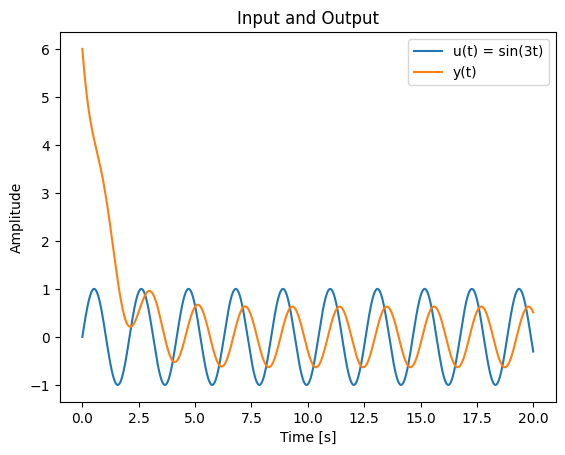

In [ ]:
omega = 3.0
t = np.linspace(0.0, 20.0, 1000)
u = np.sin(omega * t)
x0 = np.array([3.0])

tout, y, x = signal.lsim(sys_ss, U=u, T=t, X0=x0)

# Plot input and output
plt.figure()
plt.plot(tout, u, label="u(t) = sin(3t)")
plt.plot(tout, y, label="y(t)")
plt.xlabel("Time [s]")
plt.ylabel("Amplitude")
plt.title("Input and Output")
plt.legend()
plt.show()

## Plot the frequency response function: Bode plots

The input to the frequency response function is a real-valued frequency value (e.g., the frequency of the input signal) and its output is complex-valued. Often, we use two plots to visualize this function: One for magnitude-vs-frequency and one for angle-vs-frequency. Such plots are also called Bode plots. (The angle is often also called the phase.)

/usr/local/lib/python3.12/dist-packages/scipy/signal/_filter_design.py:1230: BadCoefficients: Badly conditioned filter coefficients (numerator): the results may be meaningless
  b, a = normalize(b, a)


|G(j3)|  numeric = 0.632466,  analytic = 0.632456
∠G(j3)  numeric = -71.5647°,  analytic = -71.5651°


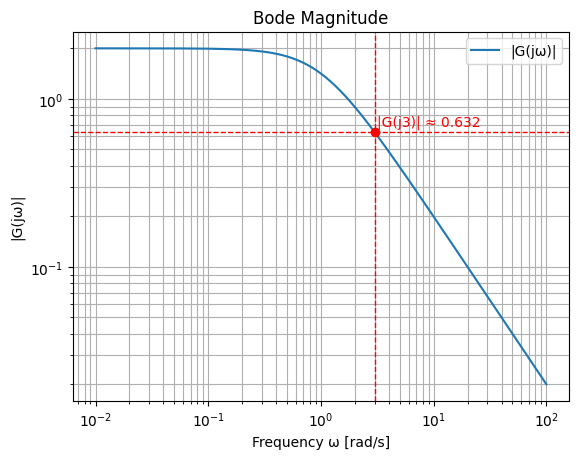

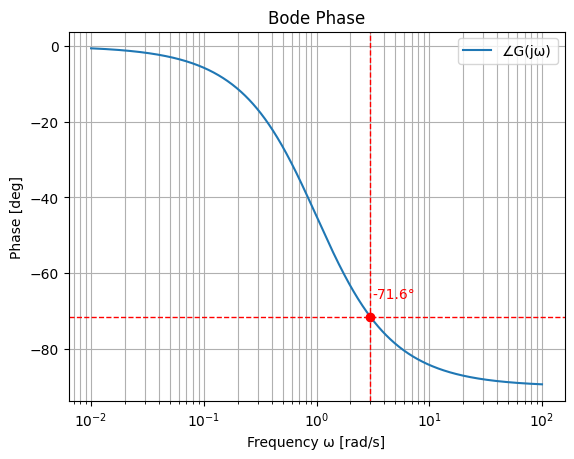

In [ ]:
# Frequency grid
w = np.logspace(-2, 2, 800)  # rad/s
w, H = signal.freqresp(sys_ss, w=w)

mag = np.abs(H)
phase = np.angle(H)

# Analytical reference values
mag_ref = 2.0 / np.sqrt(1.0 + omega**2)
phase_ref = -np.arctan(omega)

# Numeric interpolation (for plotting)
mag_at_3 = np.interp(omega, w, mag)
phase_at_3 = np.interp(omega, w, np.unwrap(phase))

print(f"|G(j3)|  numeric = {mag_at_3:.6f},  analytic = {mag_ref:.6f}")
print(f"∠G(j3)  numeric = {np.degrees(phase_at_3):.4f}°,  analytic = {np.degrees(phase_ref):.4f}°")

# --- Plot magnitude ---
plt.figure()
plt.loglog(w, mag, label="|G(jω)|")
plt.scatter([omega], [mag_ref], color="red", zorder=5)
plt.axvline(omega, color="red", linestyle="--", linewidth=1.0)
plt.axhline(mag_ref, color="red", linestyle="--", linewidth=1.0)
plt.text(omega*1.05, mag_ref*1.1, f"|G(j3)| ≈ {mag_ref:.3f}", color="red")
plt.xlabel("Frequency ω [rad/s]")
plt.ylabel("|G(jω)|")
plt.title("Bode Magnitude")
plt.legend()
plt.grid(which='both')
plt.show()

# --- Plot phase ---
plt.figure()
plt.semilogx(w, np.degrees(phase), label="∠G(jω)")
plt.scatter([omega], [np.degrees(phase_ref)], color="red", zorder=5)
plt.axvline(omega, color="red", linestyle="--", linewidth=1.0)
plt.axhline(np.degrees(phase_ref), color="red", linestyle="--", linewidth=1.0)
plt.text(omega*1.05, np.degrees(phase_ref)+5, f"{np.degrees(phase_ref):.1f}°", color="red")
plt.xlabel("Frequency ω [rad/s]")
plt.ylabel("Phase [deg]")
plt.title("Bode Phase")
plt.legend()
plt.grid(which='both')
plt.show()